In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx
from matplotlib.pyplot import figure
from pyvis.network import Network

In [2]:
#uploading the dataframes
filtred_year = pd.read_csv('filtred_year.csv')
sent_year = pd.read_csv('sent_year.csv')
received_year = pd.read_csv('received_year.csv')

In [3]:
filtred_year['Expéditeur'].value_counts()

Viviani Vincenzo              1019
Molara Bruto (della)           186
Galilei Cosimo                  68
Micalori Giovanni Battista      49
Ricci Michelangelo              45
                              ... 
Gini Girolamo                    1
Monconys Balthasar (de)          1
Girolami Orlandini Piero         1
Spada Fabrizio                   1
Lanci Giovanni Maria             1
Name: Expéditeur, Length: 385, dtype: int64

In [4]:
filtred_year['Noms cités'] = filtred_year['Noms cités'].str.replace(',', '')
filtred_year['Noms cités'] = filtred_year['Noms cités'].str.replace(' de', '')
filtred_year['Noms cités'][0]

'Torricelli Evangelista 1608-1647(citato.)Ricci Michelangelo 1619-1682(destinatario.)'

In [5]:
filtred_year['Noms cités'][9]

"Galilei Cosimo 1636-1672(destinatario.)Apollonius Pergaeus 262-190 a.C.(citato.)Galilei Bocchineri Sestilia m. 1669(citato.)Borelli Giovanni Alfonso 1608-1679(citato.)Torricelli Evangelista 1608-1647(citato.)Guldin Paul 1577-1643(citato.)Manolessi Carlo n. 1614(citato.)Marsili Alessandro 1601-1670(citato.)Medici Leopoldo' 1617-1675(citato.)Rinaldini Carlo 1615-1698(citato.)Galilei Galileo 1564-1642(citato.)"

In [6]:
filtred_year['Noms cités'] = filtred_year['Noms cités'].str.replace('(', '').str.replace(')','').str.replace('destinatario.', 'citato.').str.split('citato.',expand = False)

filtred_year['Noms cités'][9]

['Galilei Cosimo 1636-1672',
 'Apollonius Pergaeus 262-190 a.C.',
 'Galilei Bocchineri Sestilia m. 1669',
 'Borelli Giovanni Alfonso 1608-1679',
 'Torricelli Evangelista 1608-1647',
 'Guldin Paul 1577-1643',
 'Manolessi Carlo n. 1614',
 'Marsili Alessandro 1601-1670',
 "Medici Leopoldo' 1617-1675",
 'Rinaldini Carlo 1615-1698',
 'Galilei Galileo 1564-1642',
 '']

In [7]:
#model of code to extract names cited as a list
#filtred_year['Noms cités'] = filtred_year['Noms cités'].str.split(', ')
#filtred_year['Noms cités']

In [8]:
#drops columns where Noms cités is empty
filtred_year = filtred_year.dropna(subset=['Noms cités'])

In [9]:
filtred_year['Noms cités']

0       [Torricelli Evangelista 1608-1647, Ricci Miche...
1       [Torricelli Evangelista 1608-1647, Renieri Vin...
2       [Torricelli Evangelista 1608-1647, Ricci Miche...
3       [Cecchi Andrea sec. XVII, Arrighetti Andrea 15...
4       [Di Pietro sec. XVII, Viviani Alamanno m. post...
                              ...                        
2869    [Democritus ca. 460-ca. 370 a.C., Magalotti Lo...
2870                       [Viviani Vincenzo 1622-1703, ]
2871                       [Viviani Vincenzo 1622-1703, ]
2872      [Ferdinando II granduca di Toscana 1610-1670, ]
2873      [Ferdinando II granduca di Toscana 1610-1670, ]
Name: Noms cités, Length: 2807, dtype: object

In [10]:
#deleting last element of each list in each row (last element is '')
for index, row in filtred_year.iterrows():
    row['Noms cités'] = row['Noms cités'][:-1]
    filtred_year.at[index, 'Noms cités'] = row['Noms cités']

In [11]:
filtred_year['Noms cités'][0]

['Torricelli Evangelista 1608-1647', 'Ricci Michelangelo 1619-1682']

In [12]:
#format 1 : 1xxx-16xx / 1xxx-15xx / 1xxx-17xx
#format 2 : sec. ... (to split)
#format 3 : a.C.
#format 4 : n. 1590
#format 5 : m. 1669
def clean_name(name):
    l= name
    done = False
    while not done:
        if '-16' in l:
            l = l.rsplit(' ',1)[0]
        elif '-17' in l:
            l =  l.rsplit(' ',1)[0]
        elif '-15' in l:
            l =  l.rsplit(' ',1)[0]
        elif '-14' in l:
            l =  l.rsplit(' ',1)[0]
        elif '-13' in l:
            l =  l.rsplit(' ',1)[0]
        elif '-12' in l:
            l =  l.rsplit(' ',1)[0]
        elif '-11' in l:
            l =  l.rsplit(' ',1)[0]
        elif 'ca.' in l:
            l =  l.rsplit('ca.',-1)[0]
        elif 'a.C.' in l:
            l =  l.rsplit(' ', 2)[0]
        elif '-post' in l:
            l =  l.rsplit(' ', 2)[0]
        elif 'sec.' in l:
            l =  l.split('sec.', 1)[0]
        elif 'm.' in l:
            l =  l.split('m.', 1)[0]
        elif 'n.' in l:
            l =  l.split('n.', 1)[0]
        else:
            done = True
        
    return l
    

In [13]:
#removes the birth/death year from the name to be the same as expeditor/destinator 

for index, row in filtred_year.iterrows():
    for x in range(len(row['Noms cités'])):
        filtred_year.at[index, 'Noms cités'][x] = clean_name(filtred_year.loc[index]['Noms cités'][x])
    

filtred_year['Noms cités']            
        

0            [Torricelli Evangelista, Ricci Michelangelo]
1              [Torricelli Evangelista, Renieri Vincenzo]
2            [Torricelli Evangelista, Ricci Michelangelo]
3       [Cecchi Andrea , Arrighetti Andrea, Manetti Br...
4                         [Di Pietro , Viviani Alamanno ]
                              ...                        
2869                     [Democritus , Magalotti Lorenzo]
2870                                   [Viviani Vincenzo]
2871                                   [Viviani Vincenzo]
2872                  [Ferdinando II granduca di Toscana]
2873                  [Ferdinando II granduca di Toscana]
Name: Noms cités, Length: 2807, dtype: object

In [14]:
#appending all lists to get the unique names
list_of_uniques = []
for index, row in filtred_year.iterrows():
    list_of_uniques.extend(filtred_year.loc[index]['Noms cités'])
    
print(list_of_uniques)

['Torricelli Evangelista', 'Ricci Michelangelo', 'Torricelli Evangelista', 'Renieri Vincenzo', 'Torricelli Evangelista', 'Ricci Michelangelo', 'Cecchi Andrea ', 'Arrighetti Andrea', 'Manetti Braccio', 'Di Pietro ', 'Viviani Alamanno ', 'Magnani Lorenzo ', 'Chimentelli Valerio', 'Galilei Cosimo', 'Lapi Michelangelo ', 'Serni Pompeo ', "Medici Giovanni Carlo'", 'Galilei Bocchineri Sestilia ', 'Lapi Michelangelo ', 'Barberini Antonio', 'Galilei Bocchineri Sestilia ', 'Serni Bartolommeo ', 'Serni Pompeo ', 'Teri Pietro ', 'Thévenot Melchisédech', 'Viviani Pietro ', 'Galilei Cosimo', 'Apollonius Pergaeus', 'Galilei Bocchineri Sestilia ', 'Borelli Giovanni Alfonso', 'Torricelli Evangelista', 'Guldin Paul', 'Manolessi Carlo ', 'Marsili Alessandro', "Medici Leopoldo'", 'Rinaldini Carlo', 'Galilei Galileo', 'Rinaldini Carlo', 'Cecchi Andrea ', 'Bérigard Claude Guillermet ', 'Della Bella Stefano', 'Del Bianco Baccio', 'Marmi Biagio ', 'Galilei Bocchineri Sestilia ', 'Galilei Galileo', 'Alamanni'

In [15]:
#turning the list to a set to have unique values
set_of_uniques = set(list_of_uniques)
print(set_of_uniques)

{'', 'Lazari Pier Francesco ', 'Paggi', 'Pandolfi', 'Tarini Giovanni Vincenzo ', 'Rondinelli Francesco', 'Brahe Tycho', 'Morin Jean-Baptiste', 'Rainaldi Carlo', 'Vecchietti', 'Barattieri Giovanni Battista', 'Maggi Melchiorre ', 'Foggini Giovanni Battista', 'Della Gherardesca Guido', 'Salvini Bartolomeo ', 'Wiesel Johann', 'Marsili', 'Bonfiglioli Silvestro', 'Gondi Carlo Antonio ', 'Massini Carlo ', 'Pucci Giovanni Lorenzo ', 'Chiesa cattoli', 'Ligio orologiaio ', 'Borromei Giovanni Antonio ', 'La Coste Bertrand ', 'Pampieri ', 'Biondi Simone ', 'Nati Pietro', 'Orsacchi Pietro Lorenzo ', 'Salarini Ippolito ', 'Guelfi Domenico ', 'Salviati Averardo ', 'Kochanski Adam Adamandy', 'Della Rena Geri', 'Barbolani Torquato ', 'Moniglia Giulio ', 'Dal Pozzo Cassiano', 'Bellanti Pasquino ', 'Scolani', 'Fabbri Francesco ', 'Delle Colombe Ludovico ', "Henriette-Marie regina consorte d'Inghilterra", 'Colbert Jean Baptiste', 'Portinari', 'Marsili Agostino', 'Ciuti Jacopo ', 'Valori', 'Ralli Antonio '

In [16]:
len(list_of_uniques)

7103

In [17]:
len(set_of_uniques)

1399

In [18]:
textfile = open("unique_names.txt", "w")
for element in set_of_uniques:
    textfile.write(element + "\n")
textfile.close()

In [19]:
#creating a list of  the starting nodes for the network
starting_nodes = filtred_year['Expéditeur'].unique()
starting_nodes

array(['Viviani Vincenzo', 'Southwell Robert',
       'Lebesque Marainville (de)', 'Dati Carlo Roberto',
       'Viviani Vincenzo e Dati Carlo Roberto', 'Viviani Francesco',
       'Chapelain Jean', 'Chimentelli Valerio', 'Renieri Vincenzo',
       'Galilei Vincenzo', 'Guerrini Dionigi', 'Lapi Michelangelo',
       'Ricci Michelangelo', 'Barbarigo Angelo', 'Manetti Braccio',
       'Rosati Gerolamo', 'Galilei Cosimo', 'Forti Andrea',
       'Magnani Lorenzo', 'Serni Pompeo', 'Rucellai Orazio',
       'Combi & La Nou (casa editrice)', 'Retano Tommaso',
       'Serenai Lodovico', 'Morcioni Giovan Battista', 'Torsi Andrea',
       'Ridolfi Francesco', 'Micalori Giovanni Battista',
       'Magalotti Lorenzo', 'Viviani Alamanno', 'Rinaldini Carlo',
       'Tomansi Leopoldo', 'Bellincioni Giovanni', 'Molara Bruto (della)',
       'Minacci Pier Francesco', 'Querci Luca', 'Nuti Francesco',
       'Conti Francesco', 'Brown Henry', 'Cecini Fabrizio',
       'Aldobrandini Baccio', 'Barberini Carl

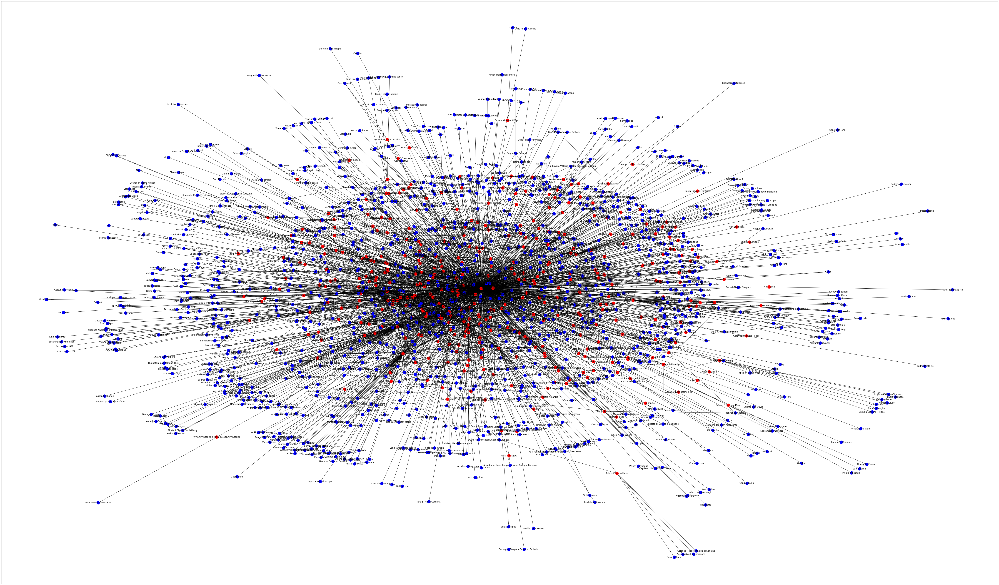

In [20]:
#creating the graph and adding the starting nodes
G = nx.Graph()
for node in starting_nodes:
    G.add_node(node)

#going through each row and adding a node/edge from names cited (destinataire is always in the names cited)
for index, row in filtred_year.iterrows():
    for node in range(len(row['Noms cités'])):
        if row['Expéditeur'] == row['Noms cités'][node]:
            pass
        else:
            if G.has_edge(row['Expéditeur'], row['Noms cités'][node]):
                G[row['Expéditeur']][row['Noms cités'][node]]['weight'] += 1
            else:
                G.add_edge(row['Expéditeur'], row['Noms cités'][node], weight = 1)
                
#setting the color map for the nodes                
color_map = ['red' if node in filtred_year['Expéditeur'].append(filtred_year['Destinataire']).unique()  else 'blue' for node in G]   


figure(figsize=(100,60))
nx.draw_networkx(G, with_labels=True, node_color = color_map)

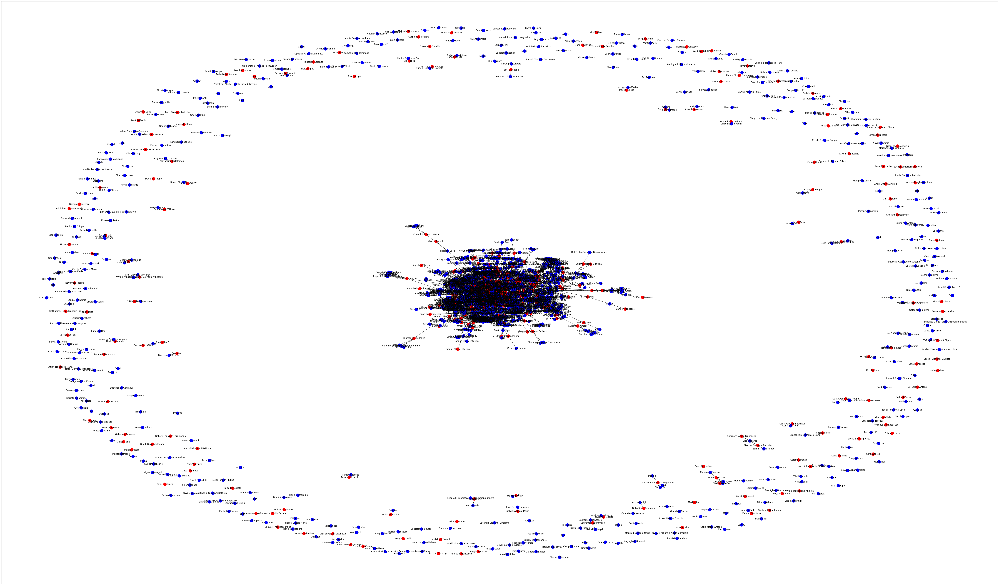

In [21]:
G.remove_node('Viviani Vincenzo')
color_map = ['red' if node in filtred_year['Expéditeur'].append(filtred_year['Destinataire']).unique() else 'blue' for node in G]  
figure(figsize=(100,60))
nx.draw_networkx(G, with_labels=True, node_color = color_map)

In [22]:
#net = Network(notebook=True,height='750px', width='100%', bgcolor='#00000', font_color='black')
#net.from_nx(G)
#net.show_buttons(filter_=['physics'])
#net.show("test.html")

In [23]:
year_1660 = filtred_year.loc[filtred_year['Year'] == '1660']
year_1660

,Expéditeur,Notes,References,Noms cités,Sujet,Titre,Date,Provenance,Destination,Destinataire,Year
41,Viviani Vincenzo,"Tipologia: letteraIncipit: ""La di Vostra Signo...","<td class=""fieldValue""><img border=""0"" src=""ht...",[Galilei Cosimo],Argomenti privati,Viviani Vincenzo a Galilei Cosimo,7/01/1660,Firenze,Bergamo,Galilei Cosimo,1660
42,Viviani Vincenzo,"Tipologia: letteraIncipit: ""Giovasi credere, a...","<td class=""fieldValue""><img border=""0"" src=""ht...","[Fabbri Francesco , Southwell Robert, Ricci Mi...",Argomenti privati,Viviani Vincenzo a [non identificato],22/01/1660,Firenze,NaN,[non identificato],1660
43,Viviani Vincenzo,"Tipologia: letteraIncipit: ""Quando io scrissi ...","<td class=""fieldValue""><img border=""0"" src=""ht...",[Magalotti Lorenzo],Argomenti privati,Viviani Vincenzo a Magalotti Lorenzo,25/01/1660,Firenze,NaN,Magalotti Lorenzo,1660
44,Viviani Vincenzo,"Tipologia: letteraIncipit: ""Se Vostra Signoria...","<td class=""fieldValue""><img border=""0"" src=""ht...","[Borelli Giovanni Alfonso, Magalotti Lorenzo, ...",Varia,Viviani Vincenzo a Magalotti Lorenzo,1660,Firenze,NaN,Magalotti Lorenzo,1660
45,Viviani Vincenzo,"Tipologia: letteraIncipit: ""Perch'io intendo d...","<td class=""fieldValue""><img border=""0"" src=""ht...","[Dati Carlo Roberto, Magalotti Lorenzo]",Argomenti privati,Viviani Vincenzo a Magalotti Lorenzo,1/02/1660,Firenze,NaN,Magalotti Lorenzo,1660
...,...,...,...,...,...,...,...,...,...,...,...
2409,Piccolomini Ascanio,"Tipologia: letteraIncipit: ""Per mano del Dotto...","<td class=""fieldValue""><img border=""0"" src=""ht...","[Viviani Vincenzo, Apollonius Pergaeus, Galile...",Notizie di libri,Piccolomini Ascanio a Viviani Vincenzo,31/08/1660,Siena,Firenze,Viviani Vincenzo,1660
2411,Galilei Cosimo,"Tipologia: letteraIncipit: ""Oh Dio Signor Vinc...","<td class=""fieldValue""><img border=""0"" src=""ht...","[Viviani Vincenzo, Apollonius Pergaeus, Kepler...",Notizie di libri,Galilei Cosimo a Viviani Vincenzo,8/09/1660,Bergamo,Firenze,Viviani Vincenzo,1660
2412,Southwell Robert,"Tipologia: letteraIncipit: ""Tribus ab hinc die...","<td class=""fieldValue""><img border=""0"" src=""ht...","[Viviani Vincenzo, Euclides , Galilei Galileo,...",Notizie di libri,Southwell Robert a Viviani Vincenzo,7novembris1660,Roma,Firenze,Viviani Vincenzo,1660
2413,Ricci Michelangelo,"Tipologia: letteraIncipit: ""Ho rossore della m...","<td class=""fieldValue""><img border=""0"" src=""ht...","[Viviani Vincenzo, Apollonius Pergaeus, Ptolem...",Notizie di libri,Ricci Michelangelo a Viviani Vincenzo,20/12/1660,Roma,Firenze,Viviani Vincenzo,1660


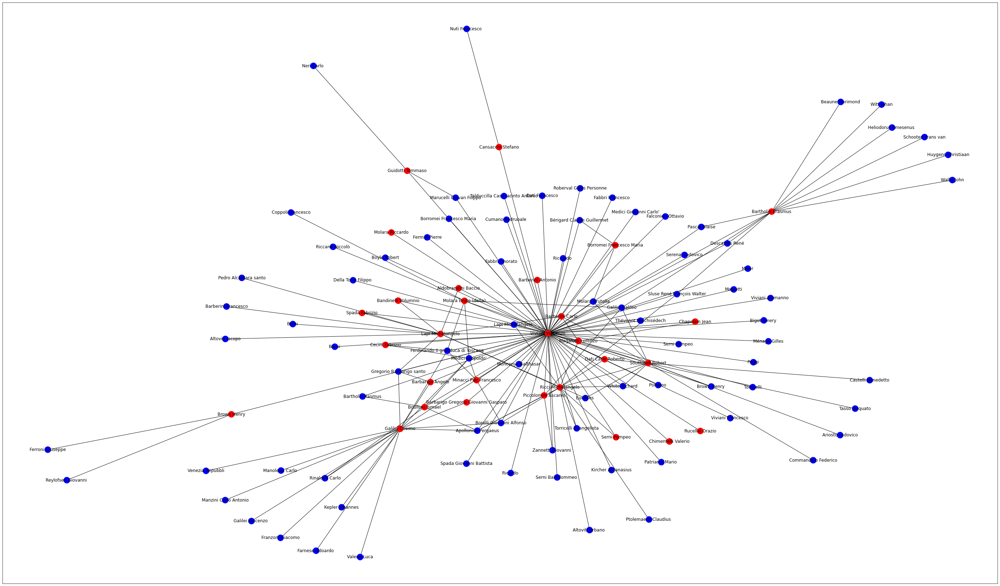

In [24]:
#creating a list of  the starting nodes for the network
starting_nodes = year_1660['Expéditeur'].unique()
starting_nodes

#creating the graph and adding the starting nodes
G = nx.Graph()
for node in starting_nodes:
    G.add_node(node)


      
    
    
#going through each row and adding a node/edge from names cited (destinataire is always in the names cited)
for index, row in year_1660.iterrows():
    for node in range(len(row['Noms cités'])):
        if row['Expéditeur'] == row['Noms cités'][node]:
            pass
        else:
            if G.has_edge(row['Expéditeur'], row['Noms cités'][node]):
                G[row['Expéditeur']][row['Noms cités'][node]]['weight'] += 1
            else:
                G.add_edge(row['Expéditeur'], row['Noms cités'][node], weight = 1)

#setting the color map for the nodes                
color_map = ['red' if node in year_1660['Expéditeur'].append(year_1660['Destinataire']).unique()  else 'blue' for node in G]     



figure(figsize=(50,30))
nx.draw_networkx(G, with_labels=True, node_color = color_map)

In [25]:
#net = Network(notebook=True,height='750px', width='100%', bgcolor='#00000', font_color='black')
#net.from_nx(G)
#net.show_buttons(filter_=['physics'])
#net.show("test1660.html")

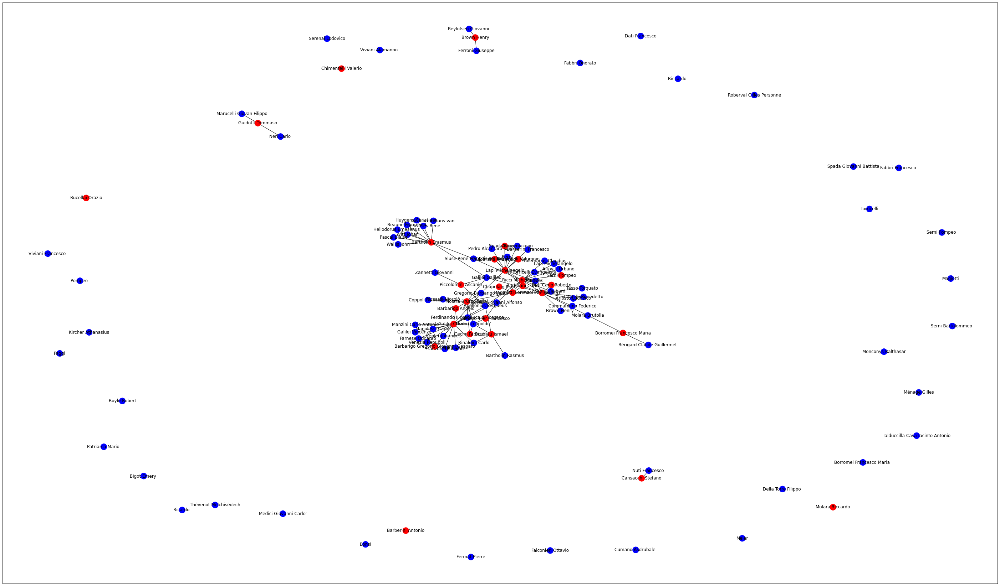

In [26]:
G.remove_node('Viviani Vincenzo')
color_map = ['red' if node in year_1660['Expéditeur'].append(year_1660['Destinataire']).unique() else 'blue' for node in G]  
figure(figsize=(50,30))
nx.draw_networkx(G, with_labels=True, node_color = color_map)

In [27]:
#net = Network(notebook=True,height='750px', width='100%', bgcolor='#00000', font_color='black')
#net.from_nx(G)
#net.show_buttons(filter_=True)
#net.show("test1660.html")

In [28]:
nx.is_connected(G)

False

In [29]:
nx.number_connected_components(G)

40

In [30]:
nx.node_connected_component(G, 'Southwell Robert')

{'Aldobrandini Baccio',
 'Altoviti Iacopo',
 'Altoviti Urbano ',
 'Apollonius Pergaeus',
 'Ariosto Ludovico',
 'Bandinelli Volumnio',
 'Barbarigo Angelo',
 'Barbarigo Gregorio Giovanni Gasparo',
 'Barberini Carlo',
 'Barberini Francesco',
 'Bartholin Erasmus',
 'Bartholin Rasmus',
 'Beaune Florimond',
 'Berni',
 'Borelli Giovanni Alfonso',
 'Borromei Francesco Maria',
 'Boulliau Ismael',
 'Brown Henry ',
 'Bérigard Claude Guillermet ',
 'Castelli Benedetto',
 'Cecini Fabrizio',
 'Chapelain Jean',
 'Commandino Federico',
 'Coppoli Francesco',
 'Dati Carlo Roberto',
 'Descartes René',
 'Euclides ',
 'Farnese Odoardo ',
 'Ferdinando II granduca di Toscana',
 'Franzoni Giacomo',
 'Galilei Cosimo',
 'Galilei Galileo',
 'Galilei Vincenzo ',
 'Gregorio Barbarigo santo',
 'Heliodorus Emesenus ',
 'Huygens Christiaan',
 'Kepler Johannes',
 'Lapi Michelangelo',
 'Lapi Michelangelo ',
 'Magalotti Lorenzo',
 'Manolessi Carlo ',
 'Manzini Carlo Antonio',
 "Medici Leopoldo'",
 'Minacci Pier Francesc

In [31]:
nx.transitivity(G)

0.03253796095444685

In [32]:

sub_graphs_test = nx.connected_components(G)
while True:
    try:
        print(next(sub_graphs_test))
    except StopIteration:
        break

{'Southwell Robert', 'Venezia Repubbli', "Medici Leopoldo'", 'Barberini Carlo', 'Brown Henry ', 'Euclides ', 'Altoviti Urbano ', 'Lapi Michelangelo ', 'Zannetti Giovanni ', 'Aldobrandini Baccio', 'Berni', 'Bérigard Claude Guillermet ', 'Molara Brutolla', 'Lapi Michelangelo', 'Bartholin Erasmus', 'Galilei Cosimo', 'Barbarigo Gregorio Giovanni Gasparo', 'Castelli Benedetto', 'Witt Johan', 'Magalotti Lorenzo', 'Bartholin Rasmus', 'Valerio Luca', 'Manolessi Carlo ', 'Manzini Carlo Antonio', 'Rinaldini Carlo', 'Pedro Alcántara santo', 'Galilei Galileo', 'Ptolemaeus Claudius ', 'Altoviti Iacopo', 'Pascal Blaise', 'Ricci Michelangelo', 'Franzoni Giacomo', 'Galilei Vincenzo ', 'Apollonius Pergaeus', 'Spada Fabrizio', 'Huygens Christiaan', 'Ariosto Ludovico', 'Torricelli Evangelista', 'Farnese Odoardo ', 'Ferdinando II granduca di Toscana', 'Borromei Francesco Maria', 'White Richard ', 'Descartes René', 'Beaune Florimond', 'Barbarigo Angelo', 'Barberini Francesco', 'Heliodorus Emesenus ', 'Mina